# Dog(🐶)-Breed-Identification

## 1. Problem

Identyfying the breed of a dog given an image of a dog.

## 2. Data

The data is from Kaggle's dog breed identification competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image. Submissions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* The data consists of images (unstructured data) - deep learning / transfer learning
* There are 120 breeds of dogs (120 different classes)
* There are around 10,000+ images in the training set (with labels)
* There are around 10,000+ images in the test set (woithout labels)

In [ ]:
# !unzip "/content/drive/MyDrive/Dog-Breed-Identification/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog-Breed-Identification"

### Get our workspace ready

* Import TensorFlow ✅
* Import TensorFlow Hub ✅
* Make sure we have a gpu available ✅

In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.12.0
TF Hub version: 0.13.0
GPU available


## Getting our data ready (turning into Tensors)

With all maxhine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations). Let's star by accessing our data and checking out the labels.

In [3]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog-Breed-Identification/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


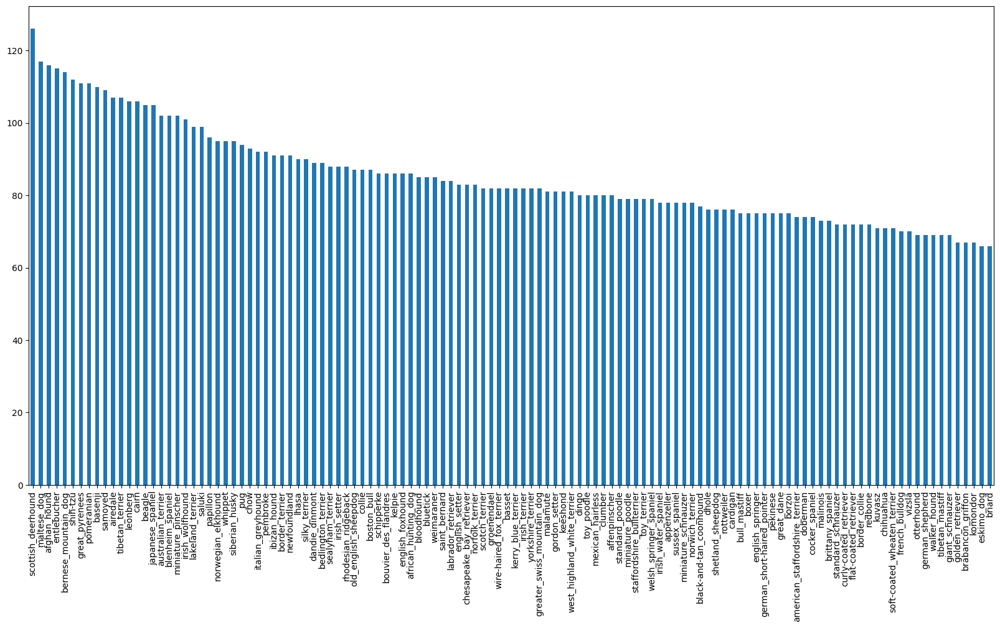

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [6]:
labels_csv["breed"].value_counts().median()

82.0

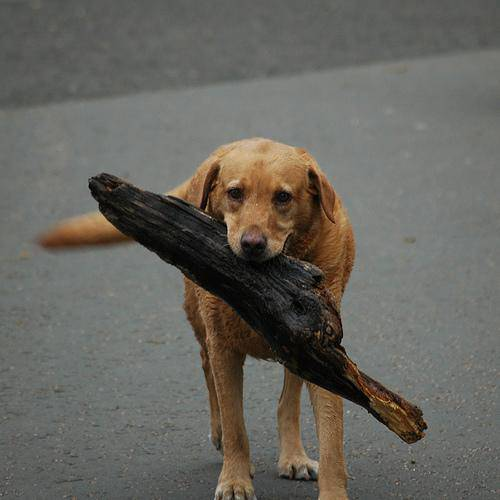

In [7]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog-Breed-Identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog-Breed-Identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog-Breed-Identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-Breed-Identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-Breed-Identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-Breed-Identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-Breed-Identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-Breed-Identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-Breed-Identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-Breed-Identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-Breed-Identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-Breed-Identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check whether number of filenames matches the number of actual images
import os
len(os.listdir("drive/MyDrive/Dog-Breed-Identification/train/")) == len(filenames)

True

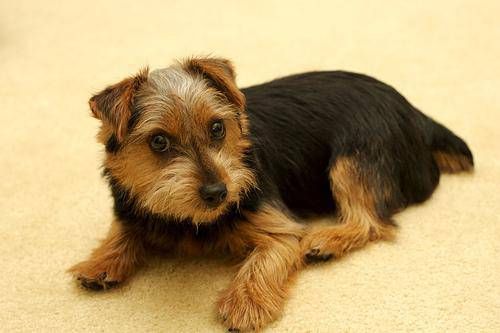

In [11]:
Image(filenames[3670])

In [12]:
labels_csv["breed"][3670]

'norfolk_terrier'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [13]:
import numpy as np
labels = np.array(labels_csv["breed"])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
# See if the number of labels matches the number of filenames
len(labels) == len(filenames)

True

In [15]:
unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [16]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2], len(boolean_labels)

([array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False]),
  array([False, False, False, Fa

### Creating our own validation set

Since the dataset from Kaggle doesn't come witha validation set, we're goig to create our own.

In [17]:
# Setup X & y variables
X = filenames
y = boolean_labels

len(filenames)

10222

In [18]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10222}

In [19]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an `image` filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize the image to be a shape of (224, 224)
6. Return the modified `image`

In [20]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (red, green, blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

`(image, label)` tuples

In [21]:
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, 
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [22]:
# Define the batch size
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of daa out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(batch_size)

    return data_batch
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)

    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels)
    # Shuffling pathnames and labels
    data = data.shuffle(buffer_size=len(X))

    # create (image, label) tuples
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(batch_size)

    return data_batch

In [23]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [24]:
# View different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [25]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [26]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[4.07878794e-02, 1.30073607e-01, 1.74716458e-01],
          [6.91142157e-02, 1.25801891e-01, 1.61691248e-01],
          [9.45200026e-02, 1.53571442e-01, 1.83630660e-01],
          ...,
          [2.78746486e-01, 1.80707276e-01, 1.65021002e-01],
          [2.69992977e-01, 1.68032184e-01, 1.64110616e-01],
          [2.61239469e-01, 1.59278661e-01, 1.55357093e-01]],
 
         [[2.54448690e-02, 1.20402858e-01, 1.67881832e-01],
          [8.80746171e-02, 1.45192772e-01, 1.81943104e-01],
          [9.59549472e-02, 1.52747676e-01, 1.88041806e-01],
          ...,
          [2.78746486e-01, 1.80707276e-01, 1.65021002e-01],
          [2.69992977e-01, 1.68032184e-01, 1.64110616e-01],
          [2.61239469e-01, 1.59278661e-01, 1.55357093e-01]],
 
         [[3.23060490e-02, 1.32820010e-01, 1.88340336e-01],
          [1.03151277e-01, 1.72531217e-01, 2.13952795e-01],
          [1.05236158e-01, 1.74348503e-01, 2.15295836e-01],
          ...,
          [2.78746486e-01, 1.80707276e-01, 1.6502

In [27]:
len(train_images), len(train_labels)

(32, 32)

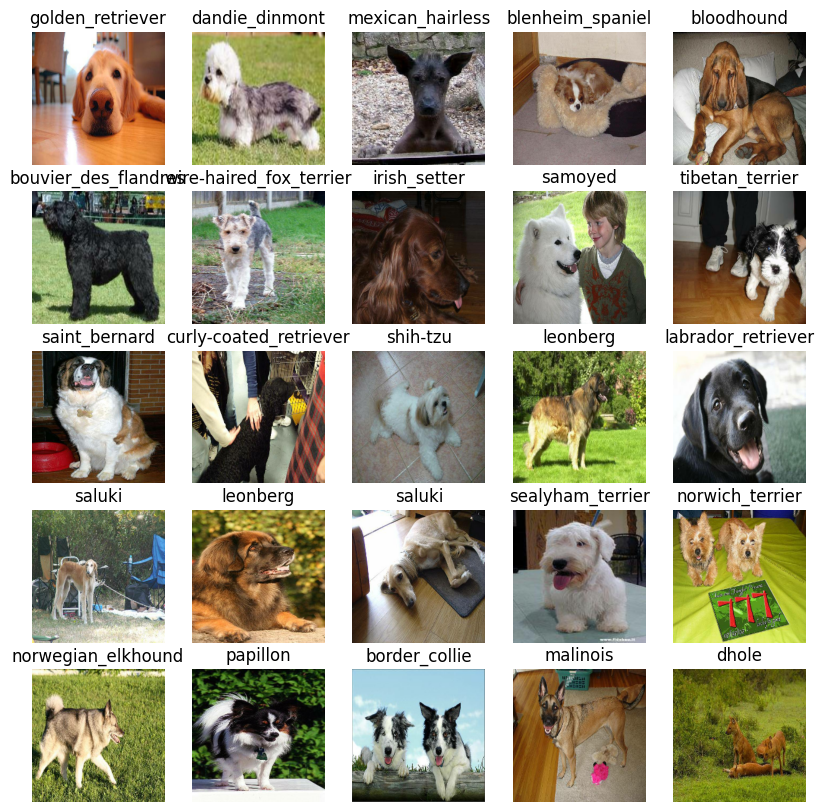

In [28]:
show_25_images(train_images, train_labels)

In [29]:
val_images, val_labels = next(val_data.as_numpy_iterator())
val_images, val_labels

(array([[[[0.29599646, 0.43284872, 0.3056691 ],
          [0.26635826, 0.32996926, 0.22846507],
          [0.31428418, 0.27701408, 0.22934894],
          ...,
          [0.77614343, 0.82320225, 0.8101595 ],
          [0.81291157, 0.8285351 , 0.8406944 ],
          [0.8209297 , 0.8263737 , 0.8423668 ]],
 
         [[0.2344871 , 0.31603682, 0.19543913],
          [0.3414841 , 0.36560842, 0.27241898],
          [0.45016077, 0.40117094, 0.33964607],
          ...,
          [0.7663987 , 0.8134138 , 0.81350833],
          [0.7304248 , 0.75012016, 0.76590735],
          [0.74518913, 0.76002574, 0.7830809 ]],
 
         [[0.30157745, 0.3082587 , 0.21018331],
          [0.2905954 , 0.27066195, 0.18401104],
          [0.4138316 , 0.36170745, 0.2964005 ],
          ...,
          [0.79871625, 0.8418535 , 0.8606443 ],
          [0.7957738 , 0.82859945, 0.8605655 ],
          [0.75181633, 0.77904975, 0.8155256 ]],
 
         ...,
 
         [[0.9746779 , 0.9878955 , 0.9342279 ],
          [0.99153

In [30]:
len(val_images), len(val_labels)

(32, 32)

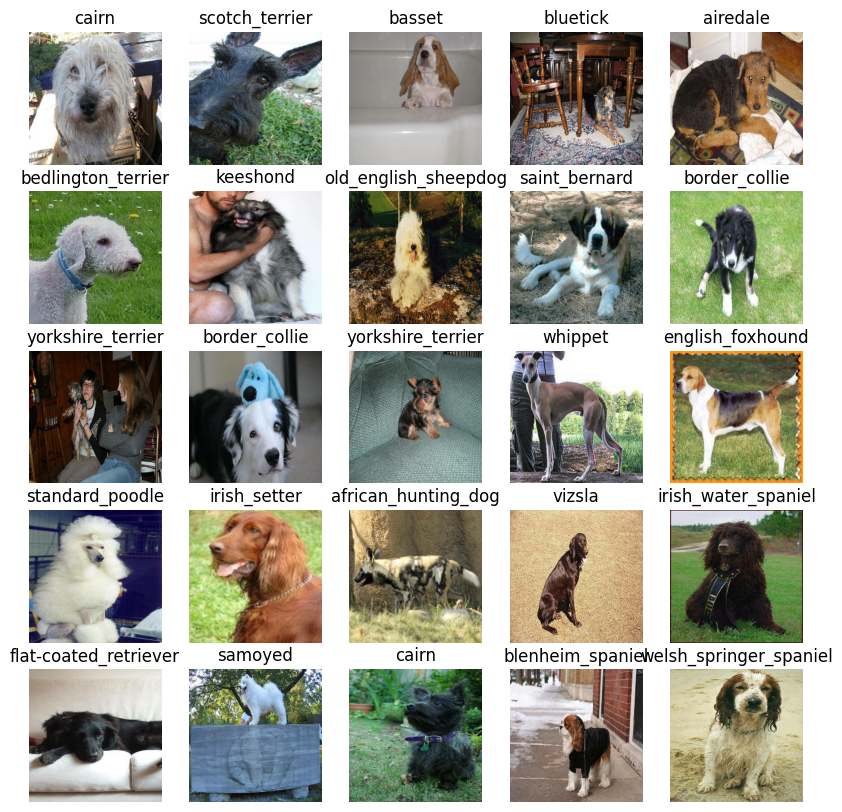

In [31]:
show_25_images(val_images, val_labels)

## Build a model 

Before we build a model, there are a few things we need to define:
* the input shape to our model.
* the output shape of our model.
* the URL of the model we want to use.


In [32]:
# Setup input shape to our model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [33]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url= MODEL_URL):
  print("Building model with:", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=output_shape,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(input_shape)

  return model

In [34]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

### TensorBoard callback

In [35]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [36]:
import datetime

def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog-Breed-Identification/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

In [37]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

In [38]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [39]:
# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


In [40]:
def train_model():
 """
 Trains a given model and returns the trained version.
 """
 # Create a model 
 model = create_model()

 # Create new Tensorboard
 tensorboard = create_tensorboard_callback()

 # Fit the model to the data passing it the callbacks we created
 model.fit(x=train_data,
           epochs=NUM_EPOCHS,
           validation_data=val_data,
           validation_freq=1,
           callbacks=[tensorboard, early_stopping])
 
 # Return the fitted model
 return model

In [41]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 142s 4s/step - loss: 4.7652 - accuracy: 0.0950 - val_loss: 3.4983 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 3s 122ms/step - loss: 1.7726 - accuracy: 0.6475 - val_loss: 2.1743 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 3s 116ms/step - loss: 0.6236 - accuracy: 0.9275 - val_loss: 1.6672 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 4s 160ms/step - loss: 0.2771 - accuracy: 0.9812 - val_loss: 1.4640 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 3s 118ms/step - loss: 0.1592 - accuracy: 0.9950 - val_loss: 1.3784 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 4s 143ms/step - loss: 0.1061 - accuracy: 1.0000 - val_loss: 1.3376 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================]

### Checking the TensorBoard logs

In [42]:
%tensorboard --logdir drive/MyDrive/Dog-Breed-Identification/logs/

<IPython.core.display.Javascript object>

## Making and evaluating predicitions using a train model

In [43]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [44]:
# Make predicitons on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=True)
predictions

7/7 [==============================] - 4s 136ms/step


array([[6.9430989e-04, 1.8617093e-05, 1.8988609e-03, ..., 1.9702670e-04,
        2.0367588e-05, 6.6941720e-04],
       [2.8718293e-03, 5.1156821e-04, 2.4050863e-02, ..., 8.9562038e-04,
        2.5948463e-04, 1.7997200e-04],
       [7.4658287e-06, 1.0491436e-04, 1.9973937e-05, ..., 3.3541663e-05,
        9.5273917e-06, 1.6260725e-04],
       ...,
       [2.5311607e-07, 5.4723623e-05, 2.4336414e-05, ..., 5.0105541e-06,
        1.7494925e-05, 2.0711621e-05],
       [1.3034003e-03, 9.2933617e-05, 5.9495786e-05, ..., 2.9807698e-04,
        2.8304041e-05, 1.3622531e-02],
       [4.9395813e-04, 5.4454369e-05, 9.2895180e-03, ..., 4.3156748e-03,
        6.1532028e-04, 4.7198363e-04]], dtype=float32)

In [45]:
predictions.shape

(200, 120)

In [46]:
np.sum(predictions[0])

0.9999999

In [47]:
# First prediction
index = 90
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.94309885e-04 1.86170928e-05 1.89886091e-03 2.68031523e-04
 1.54087291e-04 4.59326984e-05 1.23359792e-01 7.71976891e-04
 2.21542388e-04 6.69556670e-04 1.56729628e-04 1.28489541e-04
 1.94614404e-04 1.58555427e-04 2.71113566e-03 2.43277391e-04
 4.22632402e-05 4.40763056e-01 3.71773967e-05 8.26219475e-05
 1.03033170e-04 8.13703053e-04 2.89896889e-06 6.58474048e-04
 2.24774758e-05 1.25150938e-04 3.22034359e-02 2.93441281e-05
 1.65963982e-04 2.21048569e-04 7.02478501e-05 2.46264681e-04
 2.00226103e-04 6.23823216e-05 9.62327540e-05 2.19480060e-02
 3.69870286e-05 6.06533722e-04 4.93401494e-05 3.15948826e-04
 1.79162074e-03 4.95021850e-05 1.33912225e-04 5.80734013e-05
 9.44122621e-06 6.01347165e-05 7.34765490e-06 1.70397634e-05
 2.04737444e-04 5.94297899e-06 1.45579819e-04 1.85651788e-05
 4.64339770e-04 1.52561552e-04 1.23251884e-04 1.10112915e-05
 3.01531341e-04 1.22908037e-03 2.05445598e-04 1.48731964e-02
 2.46516604e-04 3.87387918e-05 1.24640251e-03 3.31429146e-05
 3.26263427e-04 1.302130

In [48]:
unique_breeds[np.argmax(y_val[90])]

'english_foxhound'

In [49]:
# Turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns a numpy array of prediction probabilities int o a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[10])
pred_label

'lhasa'

In [50]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns 
  seperate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)
  
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data) 

In [51]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], get_pred_label(labels[n]), images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)
  print(true_label)

standard_poodle


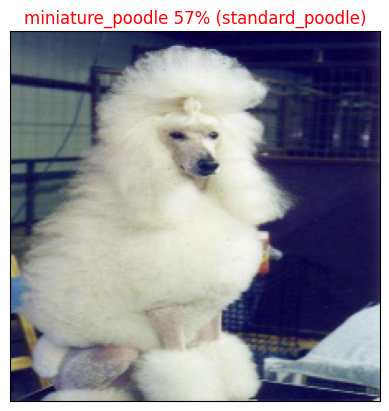

In [52]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=15)

In [53]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], get_pred_label(labels[n])

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

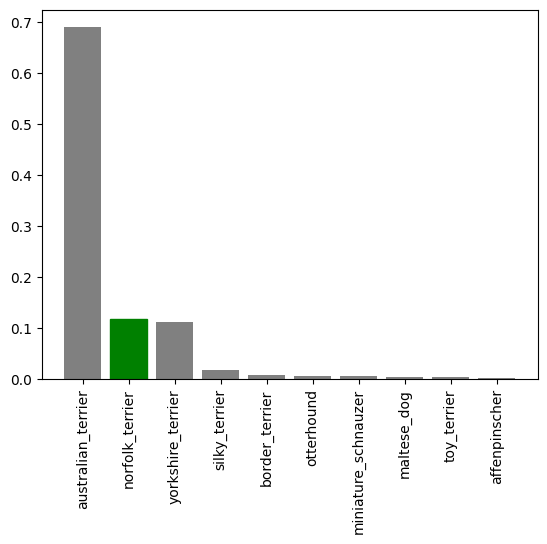

In [54]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=88)

border_collie
yorkshire_terrier
border_collie
yorkshire_terrier
whippet
english_foxhound


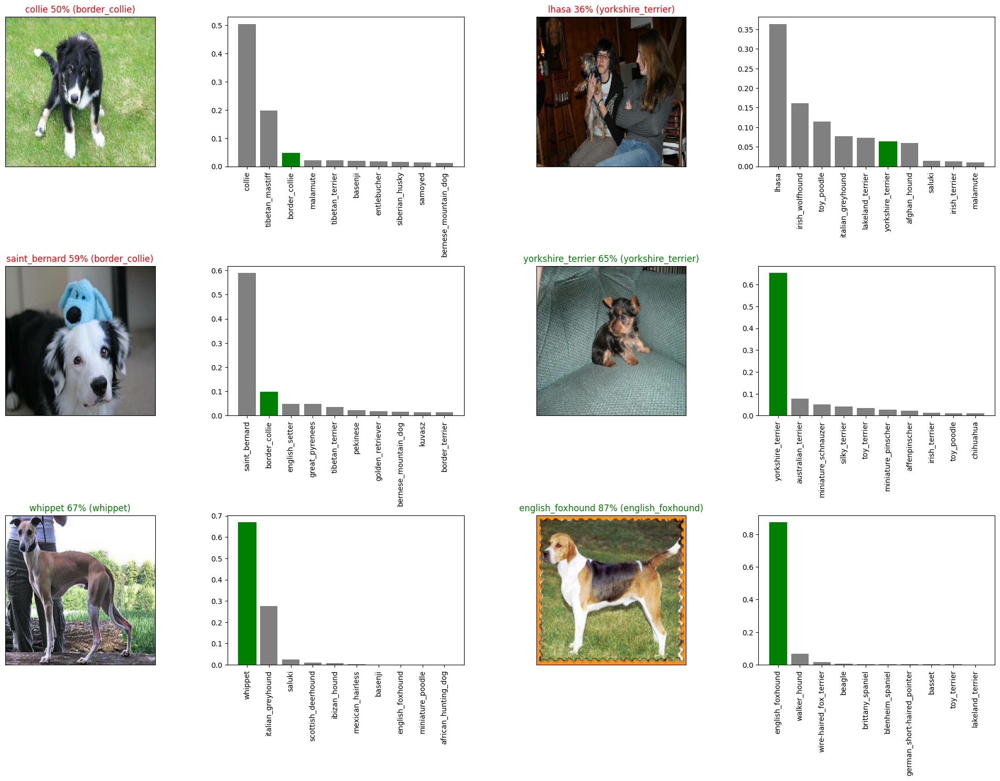

In [55]:
# Let's check a few predictions and their different values
i_multiplier = 9
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [56]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [57]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [58]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Data/models/20230425-11561682423783-1000-images-Adam.h5...


'drive/My Drive/Data/models/20230425-11561682423783-1000-images-Adam.h5'

In [59]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 105ms/step - loss: 1.2066 - accuracy: 0.6850


[1.2066327333450317, 0.6850000023841858]

## Training model on the full data

In [60]:
len(X), len(y)

(10222, 10222)

In [61]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [62]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [63]:
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [64]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [65]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 110ms/step - loss: 1.3431 - accuracy: 0.6670
Epoch 2/100
320/320 [==============================] - 33s 104ms/step - loss: 0.4042 - accuracy: 0.8819
Epoch 3/100
320/320 [==============================] - 34s 106ms/step - loss: 0.2403 - accuracy: 0.9345
Epoch 4/100
320/320 [==============================] - 34s 108ms/step - loss: 0.1556 - accuracy: 0.9646
Epoch 5/100
320/320 [==============================] - 33s 103ms/step - loss: 0.1100 - accuracy: 0.9763
Epoch 6/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0775 - accuracy: 0.9859
Epoch 7/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0575 - accuracy: 0.9918
Epoch 8/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0472 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0386 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 34s 106m

In [66]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Data/models/20230425-12081682424500-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Data/models/20230425-12081682424500-full-image-set-mobilenetv2-Adam.h5'

## Making predictions on the test dataset

In [67]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog-Breed-Identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog-Breed-Identification/test/e16c4485a37ac90e1623e2da77513648.jpg',
 '/content/drive/MyDrive/Dog-Breed-Identification/test/e0d51afc60c25eb2205be1644af09cc5.jpg',
 '/content/drive/MyDrive/Dog-Breed-Identification/test/e062ea256ada165dfe998fbc6529dff7.jpg',
 '/content/drive/MyDrive/Dog-Breed-Identification/test/e2ef94a22af1d5375132de4eb19d2a64.jpg',
 '/content/drive/MyDrive/Dog-Breed-Identification/test/e01a1ea716359e2f0062aca591ff9ca4.jpg',
 '/content/drive/MyDrive/Dog-Breed-Identification/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 '/content/drive/MyDrive/Dog-Breed-Identification/test/e55fa0c818f485f8e36edfb464c4f129.jpg',
 '/content/drive/MyDrive/Dog-Breed-Identification/test/e587c21aedc81f89b83dd326e034e7e0.jpg',
 '/content/drive/MyDrive/Dog-Breed-Identification/test/e0a6b866af64299ecf76f7cb11c80674.jpg',
 '/content/drive/MyDrive/Dog-Breed-Identification/test/dea92807aa2ac37bbc2dabf1b0eb6a39.jpg']

In [68]:
len(test_filenames)

10357

In [69]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [70]:
test_predictions = full_model.predict(test_data, verbose=True)

324/324 [==============================] - 171s 513ms/step


In [71]:
np.savetxt("drive/MyDrive/Dog-Breed-Identification/preds_array.csv", test_predictions, delimiter=" ")

In [72]:
test_predictions[:10]

array([[7.5578130e-09, 2.6860679e-08, 3.6950557e-10, ..., 1.7922854e-08,
        6.9404315e-08, 3.4319642e-06],
       [1.0702779e-08, 1.8755733e-10, 1.9291530e-12, ..., 6.8127406e-11,
        7.3128122e-11, 8.3521780e-11],
       [4.7069137e-10, 9.9983524e-09, 6.7829674e-06, ..., 3.9140930e-11,
        1.1486236e-08, 9.3585886e-09],
       ...,
       [8.6239552e-08, 1.2963746e-07, 1.1065096e-08, ..., 8.9753996e-08,
        6.7742093e-07, 1.2014805e-08],
       [1.4829760e-10, 7.7127048e-08, 7.8595424e-09, ..., 4.0072853e-05,
        2.8681261e-06, 1.4604776e-10],
       [4.4274872e-11, 4.8570475e-10, 3.8815114e-12, ..., 4.1324404e-15,
        1.4018970e-12, 4.2535643e-14]], dtype=float32)

In [73]:
test_predictions.shape

(10357, 120)

## Prepare dataset predictions for Kaggle

In [75]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [79]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [80]:
test_ids[:10]

['e16c4485a37ac90e1623e2da77513648',
 'e0d51afc60c25eb2205be1644af09cc5',
 'e062ea256ada165dfe998fbc6529dff7',
 'e2ef94a22af1d5375132de4eb19d2a64',
 'e01a1ea716359e2f0062aca591ff9ca4',
 'e7dc8cc599049ea9fa2a172c88646c57',
 'e55fa0c818f485f8e36edfb464c4f129',
 'e587c21aedc81f89b83dd326e034e7e0',
 'e0a6b866af64299ecf76f7cb11c80674',
 'dea92807aa2ac37bbc2dabf1b0eb6a39']

In [84]:
preds_df["id"] = test_ids
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e16c4485a37ac90e1623e2da77513648,7.557813e-09,2.686068e-08,3.695056e-10,2.642226e-08,5.219336e-07,2.455868e-09,1.405939e-07,1.405239e-08,1.003618e-08,...,1.231588e-07,1.390375e-09,2.363270e-07,1.676823e-07,1.306129e-07,5.951176e-02,7.110414e-08,1.792285e-08,6.940432e-08,3.431964e-06
1,e0d51afc60c25eb2205be1644af09cc5,1.070278e-08,1.875573e-10,1.929153e-12,1.330564e-10,1.958953e-12,7.746881e-12,6.696685e-12,3.006859e-09,3.643254e-11,...,2.841946e-07,1.370901e-10,1.280183e-12,1.368301e-08,1.115914e-09,1.895865e-11,1.496353e-06,6.812741e-11,7.312812e-11,8.352178e-11
2,e062ea256ada165dfe998fbc6529dff7,4.706914e-10,9.998352e-09,6.782967e-06,1.680211e-09,8.920422e-10,9.926441e-07,3.210397e-08,1.722963e-08,1.881837e-09,...,7.813217e-10,1.993717e-10,2.081445e-11,2.134517e-07,5.925733e-07,1.210633e-09,1.840642e-08,3.914093e-11,1.148624e-08,9.358589e-09
3,e2ef94a22af1d5375132de4eb19d2a64,7.583332e-10,5.548464e-10,5.139912e-11,1.402887e-07,9.887647e-09,6.067287e-09,2.359546e-08,1.429352e-06,1.536627e-02,...,6.212993e-09,5.260142e-09,4.341836e-06,4.891958e-04,4.456359e-07,2.009921e-07,1.426017e-08,5.782000e-08,1.274949e-06,4.134085e-08
4,e01a1ea716359e2f0062aca591ff9ca4,5.268906e-07,3.768448e-09,3.123647e-09,7.830745e-08,5.631212e-08,4.056983e-09,2.300593e-06,4.010423e-08,8.648086e-10,...,1.009093e-05,2.866988e-07,2.528451e-07,2.021951e-09,1.779126e-08,1.576236e-08,9.416603e-10,2.660754e-11,1.000089e-09,4.113462e-07


In [86]:
preds_df.to_csv("/content/drive/MyDrive/Dog-Breed-Identification/full_model_predictions_submission_mobilenetV2.csv",
                index=False)

## Goja

In [92]:
goja_path = "/content/drive/MyDrive/Dog-Breed-Identification/341515678_239945802031468_6109693343720072756_n.jpg"
goja_data = create_data_batches(list(goja_path), test_data=True)
goja_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
goja_preds = full_model.predict(goja_data, verbose=True)
# does not work, I think it's because I would need a full batch (or more than one photo)